In [20]:
import cv2
import numpy as np
import pickle
import matplotlib.pyplot as plt
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA
import os, tqdm
from sklearn.svm import SVC
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import auc, roc_curve
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import StandardScaler

from skimage.feature import fisher_vector, learn_gmm

from PIL import Image


from typing import *


import wandb
os.environ["WANDB_ENTITY"] = "c3-mcv"
wandb.login(key = 'ab18aafa8c70616ba4ef66844fc9444794cae54a', relogin=True)

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/carlos/.netrc


True

In [22]:
train_images_filenames = pickle.load(open('train_images_filenames.dat','rb'))
test_images_filenames = pickle.load(open('test_images_filenames.dat','rb'))
train_labels = pickle.load(open('train_labels.dat','rb'))
test_labels = pickle.load(open('test_labels.dat','rb'))

In [32]:
train_images_filenames = ["/".join(path.split("/")[3:]) for path in train_images_filenames]
test_images_filenames = ["/".join(path.split("/")[3:]) for path in test_images_filenames]

Let us first read the train and test files

In [153]:
#utils functions
def read_pickle(filepath:str) -> Any:
    """
    Read and deserialize a pickled object from the specified file.

    Parameters:
        filepath (str): The path to the file containing the pickled object.

    Returns:
        Any: The deserialized object from the pickled file.
    """
    with open(filepath, "rb") as file:
        load_file = pickle.load(file)

    return load_file

def write_pickle(information:Any,filepath:str):
    """
    Serialize and write an object to the specified file using pickle.

    Parameters:
        information (Any): The object to be serialized and written.
        filepath (str): The path to the file to write the pickled object.
    """

    abs_path = os.path.dirname(filepath)
    os.makedirs(abs_path, exist_ok=True)
    with open(filepath, "wb") as f:
        pickle.dump(information, f)

def split_image_into_blocks(image, level):
    
    # Initialize the list to store blocks
    blocks = []
    # Process each level
    for l in range(1, level + 1):
        # Calculate the number of splits along each axis
        splits = 2 ** (l - 1)

        # Split the image into blocks using np.array_split along both axes
        row_blocks = np.array_split(image, splits, axis=0)
        for row_block in row_blocks:
            col_blocks = np.array_split(row_block, splits, axis=1)
            for col_block in col_blocks:
                blocks.append(col_block)

    return blocks 




def visualize_dataset(image_filenames, labels, samples_per_class=5):
    """
    Visualize the dataset
    """
    print(f'Number of samples: {len(image_filenames)}')
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    #set size for plot
    plt.figure(figsize=(15,8))
    
    for y, cls in enumerate(classes):
        _idxs = np.flatnonzero(np.array(labels) == cls)
        idxs = np.random.choice(_idxs, samples_per_class, replace=False)
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')
            if i == 0:
                plt.title(f'{cls} ({len(_idxs)})')
    plt.show()
    
    
    
def visualize_wrong_predictions(image_filenames, labels, predictions, samples_per_class=5):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of wrongly classified samples: {sum(predictions!=labels)}')
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    #set size for plot
    plt.figure(figsize=(24,16))
    
    def get_index_fp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] != labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_fp = get_index_fp(idxs_all)
        idxs = np.random.choice(idxs_fp, samples_per_class)
        class_accuracy = 100*(1 - (len(idxs_fp)/len(idxs_all)))
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')
            if i == 0:
                plt.title(f'{cls} \n ClassAccuracy: {class_accuracy:.2f}  \n GT: {test_labels[idx]},\n Pred: {predictions[idx]}')
            else:
                plt.title(f'GT: {test_labels[idx]},\n Pred: {predictions[idx]}')
    plt.show()


def visualize_correct_predictions(image_filenames, labels, predictions, samples_per_class=5):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of correctly classified samples: {sum(predictions==labels)}')
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    #set size for plot
    plt.figure(figsize=(24,16))
    
    def get_index_tp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] == labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_tp = get_index_tp(idxs_all)
        idxs = np.random.choice(idxs_tp, samples_per_class)
        class_accuracy = 100*(len(idxs_tp)/len(idxs_all))
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')
            if i == 0:
                plt.title(f'ClassAccuracy: {class_accuracy:.2f}  \n GT: {test_labels[idx]},\n Pred: {predictions[idx]}')
            else:
                plt.title(f'GT: {test_labels[idx]},\n Pred: {predictions[idx]}')
    plt.show()
    

def histogram_intersection_kernel(X, Y):
    """
    Histogram intersection kernel.
    
    Args:
    X: array-like of shape (n_samples_X, n_features)
    Y: array-like of shape (n_samples_Y, n_features)
    
    Returns:
    kernel_matrix: array of shape (n_samples_X, n_samples_Y)
    """
    # Expand dimensions of X and Y for broadcasting
    X_expanded = np.expand_dims(X, 1)
    Y_expanded = np.expand_dims(Y, 0)

    # Compute the minimum between each pair of vectors (broadcasting)
    minima = np.minimum(X_expanded, Y_expanded)

    # Sum over the feature dimension to compute the kernel
    kernel_matrix = np.sum(minima, axis=2)

    return kernel_matrix

def histogram_intersection_distance(X, Y):
    """
    Histogram intersection distance for kNN.
    
    Args:
    X: array-like of shape (n_samples_X, n_features)
    Y: array-like of shape (n_samples_Y, n_features)
    
    Returns:
    distance_matrix: array of shape (n_samples_X, n_samples_Y)
    """
    # Calculate the histogram intersection similarity
    similarity = histogram_intersection_kernel(X, Y)
    
    max_similarity = np.minimum(X.sum(axis=1)[:, np.newaxis], Y.sum(axis=1)[np.newaxis, :])
    return 1 - (similarity / max_similarity)

def accuracy(predictions, labels):
    return sum(predictions == labels) / len(labels)

def precision(predictions, labels, class_label):
    tp = np.sum((predictions == class_label) & (labels == class_label))
    fp = np.sum((predictions == class_label) & (labels != class_label))
    return tp / (tp + fp) if (tp + fp) > 0 else 0

def recall(predictions, labels, class_label):
    tp = np.sum((predictions == class_label) & (labels == class_label))
    fn = np.sum((predictions != class_label) & (labels == class_label))
    return tp / (tp + fn) if (tp + fn) > 0 else 0

def average_precision(predictions, labels):
    classes = np.unique(labels)
    return np.mean([precision(predictions, labels, c) for c in classes])

def average_recall(predictions, labels):
    classes = np.unique(labels)
    return np.mean([recall(predictions, labels, c) for c in classes])

def average_f1(predictions, labels):
    return 2 * average_precision(predictions, labels) * average_recall(predictions, labels) / (average_precision(predictions, labels) + average_recall(predictions, labels))

def compute_macro_roc_curve(y_onehot_test, y_score):
    """
    Computes the ROC curve and ROC area for each class.
    
    Args:
    y_onehot_test: array-like of shape (n_samples, n_classes)
    prob_matrix: array-like of shape (n_samples, n_classes)
    """
    n_classes = y_onehot_test.shape[1]
    # store the fpr, tpr
    fpr, tpr = dict(), dict()
    fpr_grid = np.linspace(0.0, 1.0, 1000)

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_score[:, i])

    # Interpolate all ROC curves at these points
    mean_tpr = np.zeros_like(fpr_grid)

    for i in range(n_classes):
        mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

    return fpr_grid, mean_tpr / n_classes

def compute_micro_roc_curve(y_onehot_test, y_score):
    """
    Computes the micro ROC curve and ROC area.
    
    Args:
    y_onehot_test: array-like of shape (n_samples, n_classes)
    prob_matrix: array-like of shape (n_samples, n_classes)
    """
    # Compute micro-average ROC curve
    fpr, tpr, _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())

    return fpr, tpr



In [86]:
class BoVW():
    def __init__(self, config, size_per_class=1e9, preload_features=False, folder_path_train='./MIT_split/train', folder_path_test='./MIT_split/test'):

        self.config = config
        
        self.train_dataset = {'image_paths': [], 'labels': []}
        self.test_dataset = {'image_paths': [], 'labels': []}

        for label in os.listdir(folder_path_train):
            for i,image_name in enumerate(os.listdir(os.path.join(folder_path_train, label))):
                self.train_dataset['image_paths'].append(os.path.join(folder_path_train, label, image_name))
                self.train_dataset['labels'].append(label)

                # good for making a small test
                if i >= size_per_class:
                    break
        
        
        for label in os.listdir(folder_path_test):
            for i,image_name in enumerate(os.listdir(os.path.join(folder_path_test, label))):
                self.test_dataset['image_paths'].append(os.path.join(folder_path_test, label, image_name))
                self.test_dataset['labels'].append(label)
                
                # good for making a small test
                if i >= size_per_class:
                    break
        
        self.train_dataset['labels'] = np.array(self.train_dataset['labels'])
        self.test_dataset['labels'] = np.array(self.test_dataset['labels'])
        self.train_features_cluster, self.train_features_level, self.test_features_level = self._compute_features(preload=preload_features)
        
        # Classification
        if self.config['classifier'] == 'knn':
            self.classifier = KNeighborsClassifier(n_neighbors=self.config['n_neighbors'], algorithm=self.config['algorithm'], p=self.config["p"],  n_jobs=-1)
        elif self.config['classifier'] == 'svm':
            self.classifier = SVC(kernel = self.config['kernel'], degree=self.config['degree_pol'], gamma = 'auto', C = self.config['C'], probability=True, random_state=123)
        elif self.config['classifier'] == 'logistic':
            self.classifier = LogisticRegression(multi_class = 'auto', penalty='l2', solver='lbfgs', C = self.config['C'], n_jobs=-1, random_state=123)
            

        self.dim_red = None
        if self.config['n_components'] > 0:
            self.dim_red = PCA(n_components = self.config['n_components'])

        # Standarization
        self.scaler = None
        if self.config['scaler']:
            self.scaler = StandardScaler(with_mean=True, with_std=True)


    def _compute_descriptor_level(self, gray_chunk, color_chunk):

        if self.config['descriptor'] == 'dense_sift':
            # Initialize Dense SIFT extractor
            sift = cv2.SIFT_create()
            kp = [cv2.KeyPoint(x, y, self.config['step_size']) for y in range(0, gray_chunk.shape[0], self.config['step_size'])
                                                                for x in range(0, gray_chunk.shape[1], self.config['step_size'])]
            _, des = sift.compute(gray_chunk, kp)

        elif self.config['descriptor'] == 'sift':
            # Initialize Dense SIFT extractor
            sift = cv2.SIFT_create(nfeatures=self.config["n_features"])
            _, des = sift.detectAndCompute(gray_chunk, None)

        elif self.config['descriptor'] == 'akaze':
            # Initialize AKAZE extractor
            akaze = cv2.AKAZE_create(descriptor_type=cv2.AKAZE_DESCRIPTOR_KAZE, threshold=0.0001)
            _, des = akaze.detectAndCompute(color_chunk, None)
          
        return des

    def _compute_features(self, preload=False):
        
        if preload:
            level_features_train = read_pickle(filepath=os.path.join(".", "descriptors", "train", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"))
            level_features_test = read_pickle(filepath=os.path.join(".", "descriptors", "test", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"))
            cluster_features_train = np.concatenate([np.concatenate(image_feat_array, axis=0) for image_feat_array in level_features_train], axis=0)
            return cluster_features_train, level_features_train, level_features_test

        cluster_features_train = []
        level_features_train, level_features_test = [], []
        # Iterate over all files in the directory
        for i,dataset in enumerate([self.train_dataset['image_paths'], self.test_dataset['image_paths']]):
            for filename in tqdm.tqdm(dataset, desc='Extracting features from dataset %d' % i):
                
                # Load the imag
                img = cv2.imread(filename)
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                img_blocks = split_image_into_blocks(img, self.config['level_pyramid'])
                gray_blocks = split_image_into_blocks(gray, self.config['level_pyramid'])

                level_features = [] # levels x np.array([n_features, 128])
                for c_block, g_block in zip(img_blocks, gray_blocks):
                    des = self._compute_descriptor_level(g_block, c_block)

                    if des is not None:
                        level_features.append(des.astype(np.float64)) # may contain different number of features for each level
                    else:
                        hist, _ = np.histogramdd(c_block.reshape(-1, 3), bins = 128 if self.config['descriptor'] != 'akaze' else 64)
                        level_features.append((hist.sum(axis=1).sum(axis=0) / hist.sum()).reshape(1,-1).astype(np.float64))
                
                cluster_features = np.concatenate(level_features, axis=0) # shape (levels * n_features, 128), n_features does not need to be the same for each level

                if i == 0:
                    cluster_features_train.append(cluster_features)
                    level_features_train.append(level_features)
                else:
                    level_features_test.append(level_features)

        # saving features -> from level_features we can get the cluster_features
        os.makedirs(os.path.join(".", "descriptors", "train"), exist_ok=True)
        write_pickle(filepath=os.path.join(".", "descriptors", "train", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"), information=level_features_train)
        
        os.makedirs(os.path.join(".", "descriptors", "test"), exist_ok=True)
        write_pickle(filepath=os.path.join(".", "descriptors", "test", self.config["descriptor"]+'_'+ str(self.config["level_pyramid"]) + ".pkl"), information=level_features_test)
        return np.concatenate(cluster_features_train, axis=0), level_features_train, level_features_test

    def fit(self, train_features_cluster=None, train_features_level=None, y_train_labels=None):

        if train_features_cluster is None and train_features_level is None and y_train_labels is None:
            train_features_cluster = self.train_features_cluster
            train_features_level = self.train_features_level
            y_train_labels = self.train_dataset['labels']
         
        if self.config["fisher"]:
            self.cluster = learn_gmm(self.train_features_cluster, n_modes=self.config["n_words"], gm_args={'n_init': 1, 'max_iter': 50, 'covariance_type':'diag'})
        else:
            self.cluster = MiniBatchKMeans(n_clusters=self.config['n_words'], n_init='auto', compute_labels=False, random_state=123)
            self.cluster.fit(self.train_features_cluster)
        
        dim_des = 128 if self.config['descriptor'] != 'akaze' else 64
        dim_size = self.config['n_words'] if not self.config["fisher"] else 2*self.config['n_words']*dim_des + self.config['n_words'] # n_words or 2KD+K for fisher
        visual_words_train = np.zeros((len(train_features_level), self.config['level_pyramid'], dim_size), dtype=np.float64) # we will need shape (n_images, dim_size)
        
        for i in range(len(train_features_level)):
            for l in range(self.config['level_pyramid']):
                words = self.cluster.predict(train_features_level[i][l]) if not self.config["fisher"] else fisher_vector(train_features_level[i][l], self.cluster)
                visual_words_train[i,l,:] = np.bincount(words, minlength=self.config['n_words']) if not self.config["fisher"] else words


        visual_words_train = visual_words_train.reshape(len(train_features_level), -1) #get shape (n_images, dim_size)

        if self.config['scaler']:
            visual_words_train = self.scaler.fit_transform(visual_words_train)

        if self.dim_red is not None:
            visual_words_train = self.dim_red.fit_transform(visual_words_train)
        
         # Compute distance/kenrel matrix
        if self.config['classifier'] == 'knn' and self.config['metric'] == 'precomputed':
            self.visual_words_train_old = visual_words_train.copy()
            visual_words_train = histogram_intersection_distance(visual_words_train, visual_words_train)
        elif self.config['classifier'] == 'svm' and self.config['kernel'] == 'precomputed':
            self.visual_words_train_old = visual_words_train.copy()
            visual_words_train = histogram_intersection_kernel(visual_words_train, visual_words_train)
            
        self.classifier.fit(visual_words_train, y_train_labels)


    def predict(self, test_features_level=None):

        if test_features_level is None:
            test_features_level = self.test_features_level

        dim_des = 128 if self.config['descriptor'] != 'akaze' else 64
        dim_size = self.config['n_words'] if not self.config["fisher"] else 2*self.config['n_words']*dim_des + self.config['n_words'] # n_words or 2KD+K for fisher
        visual_words_test = np.zeros((len(test_features_level), self.config['level_pyramid'], dim_size), dtype=np.float64) # we will need shape (n_images, dim_size)


        for i in range(len(test_features_level)):
            for l in range(self.config['level_pyramid']):
                words = self.cluster.predict(test_features_level[i][l]) if not self.config["fisher"] else fisher_vector(test_features_level[i][l], self.cluster)
                visual_words_test[i,l,:] = np.bincount(words, minlength=self.config['n_words']) if not self.config["fisher"] else words

        visual_words_test = visual_words_test.reshape(len(test_features_level), -1) # get shape (n_images, dim_size*level_pyramid)

        if self.config['scaler']:
            visual_words_test = self.scaler.transform(visual_words_test)
        
        if self.dim_red is not None:
            visual_words_test = self.dim_red.transform(visual_words_test)

        # Compute distance/kenrel matrix
        if self.config['classifier'] == 'knn' and self.config['metric'] == 'precomputed':
            visual_words_test = histogram_intersection_distance(visual_words_test, self.visual_words_train_old)
        elif self.config['classifier'] == 'svm' and self.config['kernel'] == 'precomputed':
            visual_words_test = histogram_intersection_kernel(visual_words_test, self.visual_words_train_old)

        return self.classifier.predict(visual_words_test), self.classifier.predict_proba(visual_words_test)
    
def cross_validation(bovw):
    
    kf = KFold(n_splits=bovw.config['n_folds'], shuffle=True, random_state=123)
    predictions, y_scores, labels = [], [], []

    for train_index, test_index in tqdm.tqdm(kf.split(bovw.train_features_level), desc='Cross validation', total=bovw.config['n_folds']):
        # Split features and labels for this fold
        X_train_level, X_test_level = [bovw.train_features_level[i] for i in train_index] , [bovw.train_features_level[i] for i in test_index]
        y_train_level, y_test = bovw.train_dataset['labels'][train_index], bovw.train_dataset['labels'][test_index]

        X_train_cluster = np.concatenate([np.concatenate(image_feat_array, axis=0) for image_feat_array in X_train_level], axis=0)

        # Fit the classifier
        bovw.fit(X_train_cluster, X_train_level, y_train_level)
        # Predict the test set
        pred, y_score = bovw.predict(X_test_level)
        
        y_scores.append(y_score)
        predictions.append(pred)
        labels.append(y_test)

    return predictions, y_scores, labels
    
def log_metrics(config, predictions, y_scores, y_test, plot='micro'):
    wandb.log({
        'accuracy': np.mean([accuracy(predictions[i], y_test[i]) for i in range(len(predictions))]),
        'average_precision': np.mean([average_precision(predictions[i], y_test[i]) for i in range(len(predictions))]),
        'average_recall': np.mean([average_recall(predictions[i], y_test[i]) for i in range(len(predictions))]),
        'average_f1': np.mean([average_f1(predictions[i], y_test[i]) for i in range(len(predictions))]),
    })

    # ----------------- #
    #Log ROC curve
    
    n_folds = config['n_folds']
    result_auc = []
    for n in range(n_folds):
        y_onehot_test = LabelBinarizer().fit_transform(y_test[n])
        if plot == 'micro':
            fpr, tpr = compute_micro_roc_curve(y_onehot_test, y_scores[n])
        else:
            fpr, tpr = compute_macro_roc_curve(y_onehot_test, y_scores[n])

        #compute AUC
        result_auc.append(auc(fpr, tpr))
    wandb.log({'AUC': np.mean(result_auc)})



def sweep_bovw():
    with wandb.init() as run:
        # Get hyperparameters
        config = run.config
        if config['fisher']:
            config['n_words'] = config['n_words'] // 2
        print(config)
        bovw = BoVW(config)
        predictions, y_scores, labels = cross_validation(bovw)
        log_metrics(config, predictions, y_scores, labels)


In [5]:
# 'n_neigh': {'distribution':'int_uniform', 'min': 1, 'max': 10}
# 'metric': {'values': ['euclidean', 'manhattan', 'cosine', 'precomputed]} # implement histogram intersection function distance
# 'step_size': {'distribution':'int_uniform', 'min': 4, 'max': 50},

# Define the sweep for each classifier and each descriptor
sweep_configuration = {
    "method": "bayes",
    "name": "sweep-KNN-dense_sift_bo",
    "metric": {"goal": "maximize", "name": "accuracy"},
    "parameters": {
        'classifier': {'value': 'knn'},
        'descriptor': {'value': 'dense_sift'},
        'step_size': {'distribution':'int_uniform', 'min': 10, 'max': 100 },
        'n_features': {'value': 300},
        'n_folds': {'value': 5},
        'n_words': {'value': 1024},
        'level_pyramid': {'value': 1},
        'n_neighbors': {'values':[10, 18, 20]},
        'n_components': {'distribution':'int_uniform', 'min': 32, 'max': 512},
        'algorithm': {'values': ['auto']},
        'p': {'values': [2]},
        'fisher': {'values': [False]},
        'scaler': {'values': [True, False]},
    },
}

sweep_id = wandb.sweep(sweep=sweep_configuration, project="bovw", entity="c3-mcv") # EJECUTAR UNA VEZ POR CLASIFICADOR Y DESCRIPTOR

Create sweep with ID: d5rzeqz9
Sweep URL: https://wandb.ai/c3-mcv/bovw/sweeps/d5rzeqz9


In [6]:
wandb.agent('c3-mcv/bovw/d5rzeqz9', function=sweep_bovw, count=5)

wandb: Agent Starting Run: s2jikg8h with config:
wandb: 	algorithm: auto
wandb: 	classifier: knn
wandb: 	descriptor: dense_sift
wandb: 	fisher: False
wandb: 	level_pyramid: 1
wandb: 	n_components: 330
wandb: 	n_features: 300
wandb: 	n_folds: 5
wandb: 	n_neighbors: 18
wandb: 	n_words: 1024
wandb: 	p: 2
wandb: 	scaler: True
wandb: 	step_size: 26
wandb: Currently logged in as: bycarkos (c3-mcv). Use `wandb login --relogin` to force relogin


{'algorithm': 'auto', 'classifier': 'knn', 'descriptor': 'dense_sift', 'fisher': False, 'level_pyramid': 1, 'n_components': 330, 'n_features': 300, 'n_folds': 5, 'n_neighbors': 18, 'n_words': 1024, 'p': 2, 'scaler': True, 'step_size': 26}


Cross validation: 100%|███████████████████████████| 5/5 [00:35<00:00,  7.05s/it]


AUC,▁
accuracy,▁
average_f1,▁
average_precision,▁
average_recall,▁
AUC,0.67782
accuracy,0.27909
average_f1,0.27849
average_precision,0.28302
average_recall,0.27432


wandb: Agent Starting Run: 7kh36bjk with config:
wandb: 	algorithm: auto
wandb: 	classifier: knn
wandb: 	descriptor: dense_sift
wandb: 	fisher: False
wandb: 	level_pyramid: 1
wandb: 	n_components: 61
wandb: 	n_features: 300
wandb: 	n_folds: 5
wandb: 	n_neighbors: 20
wandb: 	n_words: 1024
wandb: 	p: 2
wandb: 	scaler: False
wandb: 	step_size: 99


{'algorithm': 'auto', 'classifier': 'knn', 'descriptor': 'dense_sift', 'fisher': False, 'level_pyramid': 1, 'n_components': 61, 'n_features': 300, 'n_folds': 5, 'n_neighbors': 20, 'n_words': 1024, 'p': 2, 'scaler': False, 'step_size': 99}


Cross validation: 100%|███████████████████████████| 5/5 [00:13<00:00,  2.67s/it]


AUC,▁
accuracy,▁
average_f1,▁
average_precision,▁
average_recall,▁
AUC,0.79992
accuracy,0.39766
average_f1,0.4013
average_precision,0.4091
average_recall,0.39402


wandb: Agent Starting Run: zpya9clz with config:
wandb: 	algorithm: auto
wandb: 	classifier: knn
wandb: 	descriptor: dense_sift
wandb: 	fisher: False
wandb: 	level_pyramid: 1
wandb: 	n_components: 365
wandb: 	n_features: 300
wandb: 	n_folds: 5
wandb: 	n_neighbors: 20
wandb: 	n_words: 1024
wandb: 	p: 2
wandb: 	scaler: True
wandb: 	step_size: 47


{'algorithm': 'auto', 'classifier': 'knn', 'descriptor': 'dense_sift', 'fisher': False, 'level_pyramid': 1, 'n_components': 365, 'n_features': 300, 'n_folds': 5, 'n_neighbors': 20, 'n_words': 1024, 'p': 2, 'scaler': True, 'step_size': 47}


Cross validation: 100%|███████████████████████████| 5/5 [00:24<00:00,  4.84s/it]


AUC,▁
accuracy,▁
average_f1,▁
average_precision,▁
average_recall,▁
AUC,0.7025
accuracy,0.31419
average_f1,0.31317
average_precision,0.31996
average_recall,0.30681


wandb: Agent Starting Run: z0cs0s1t with config:
wandb: 	algorithm: auto
wandb: 	classifier: knn
wandb: 	descriptor: dense_sift
wandb: 	fisher: False
wandb: 	level_pyramid: 1
wandb: 	n_components: 85
wandb: 	n_features: 300
wandb: 	n_folds: 5
wandb: 	n_neighbors: 20
wandb: 	n_words: 1024
wandb: 	p: 2
wandb: 	scaler: False
wandb: 	step_size: 99


{'algorithm': 'auto', 'classifier': 'knn', 'descriptor': 'dense_sift', 'fisher': False, 'level_pyramid': 1, 'n_components': 85, 'n_features': 300, 'n_folds': 5, 'n_neighbors': 20, 'n_words': 1024, 'p': 2, 'scaler': False, 'step_size': 99}


Cross validation: 100%|███████████████████████████| 5/5 [00:13<00:00,  2.62s/it]


AUC,▁
accuracy,▁
average_f1,▁
average_precision,▁
average_recall,▁
AUC,0.76421
accuracy,0.38222
average_f1,0.39011
average_precision,0.39785
average_recall,0.38304


wandb: Agent Starting Run: qsc9lqbp with config:
wandb: 	algorithm: auto
wandb: 	classifier: knn
wandb: 	descriptor: dense_sift
wandb: 	fisher: False
wandb: 	level_pyramid: 1
wandb: 	n_components: 110
wandb: 	n_features: 300
wandb: 	n_folds: 5
wandb: 	n_neighbors: 20
wandb: 	n_words: 1024
wandb: 	p: 2
wandb: 	scaler: False
wandb: 	step_size: 98


{'algorithm': 'auto', 'classifier': 'knn', 'descriptor': 'dense_sift', 'fisher': False, 'level_pyramid': 1, 'n_components': 110, 'n_features': 300, 'n_folds': 5, 'n_neighbors': 20, 'n_words': 1024, 'p': 2, 'scaler': False, 'step_size': 98}


Cross validation: 100%|███████████████████████████| 5/5 [00:13<00:00,  2.62s/it]


AUC,▁
accuracy,▁
average_f1,▁
average_precision,▁
average_recall,▁
AUC,0.74565
accuracy,0.35088
average_f1,0.35559
average_precision,0.36852
average_recall,0.34363


In [44]:
config = {
    'descriptor': 'dense_sift',
    'step_size': 75,
    'n_words': 1024,
    "n_features": 1024,
    'n_neigh': 18,
    'metric': None,
    'n_folds': None,
    'n_components': 46,
    'level_pyramid': 3,
    'classifier': 'knn',
    'n_neighbors' : 18,
    'p' : 2,
    "algorithm" : "brute",
    'fisher': False,
    'scaler': False,
}
bovw = BoVW(config, preload_features=False)
bovw.fit()
predictions, y_score = bovw.predict()

Extracting features from dataset 1: 100%|█████| 807/807 [00:14<00:00, 54.02it/s]


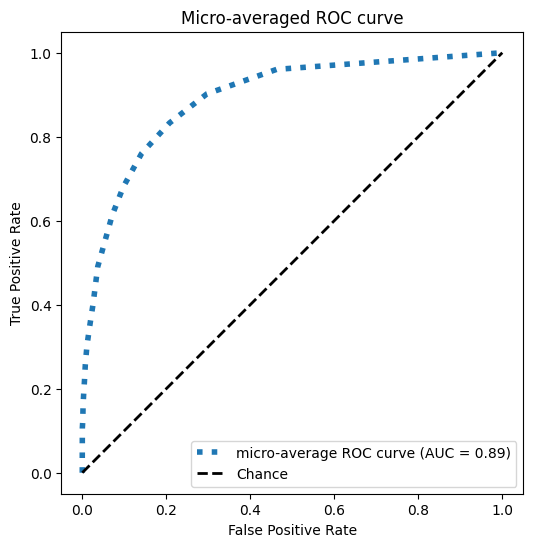

In [41]:
y_onehot_test = LabelBinarizer().fit_transform(bovw.test_dataset['labels'])
n_classes = y_onehot_test.shape[1]
fpr1, tpr1 = compute_micro_roc_curve(y_onehot_test, y_score)

plt.figure(figsize=(6, 6))
plt.plot(
    fpr1,
    tpr1,
    label=f"micro-average ROC curve (AUC = {auc(fpr1, tpr1):.2f})",
    color="tab:blue",
    linestyle=":",
    linewidth=4,
)

# plot chance level
plt.plot([0, 1], [0, 1], linestyle="--", color="black", linewidth=2, label="Chance")

plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged ROC curve")
plt.legend()

## Visualize Dataset:

Number of samples: 1881


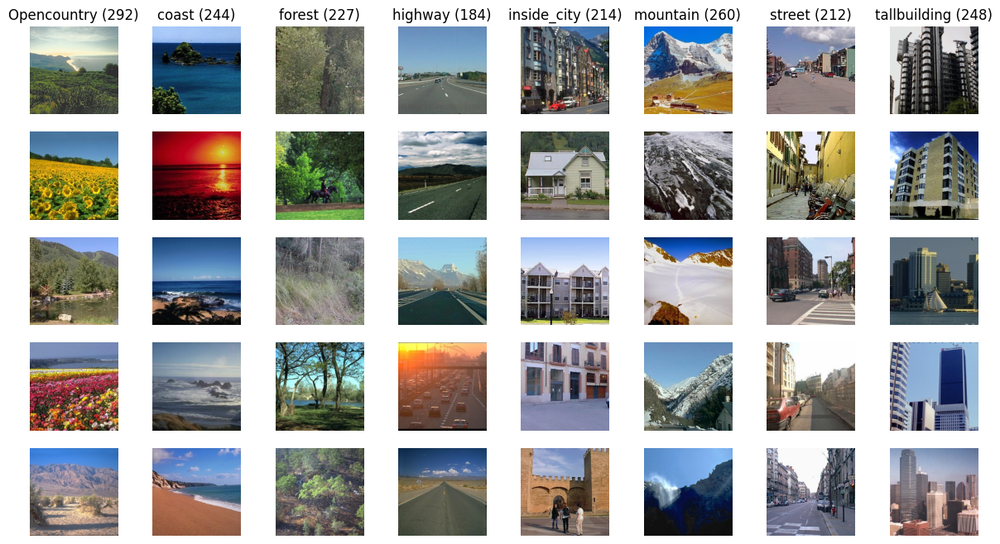

In [31]:
visualize_dataset(train_images_filenames, train_labels, samples_per_class=5)

## Doing the Inference

In [87]:
config = {
    'descriptor': 'dense_sift',
    'step_size': 75,
    'n_words': 1024,
    "n_features": 1024,
    'n_neigh': 18,
    'metric': None,
    'n_folds': None,
    'n_components': 128,
    'level_pyramid': 3,
    'classifier': 'knn',
    'n_neighbors' : 18,
    'p' : 2,
    "algorithm" : "brute",
    'fisher': False,
    'scaler': False,
}
bovw = BoVW(config, preload_features=False)
bovw.fit()
predictions, y_score = bovw.predict()

Extracting features from dataset 1: 100%|█████| 807/807 [00:14<00:00, 56.13it/s]


## Computing metrics

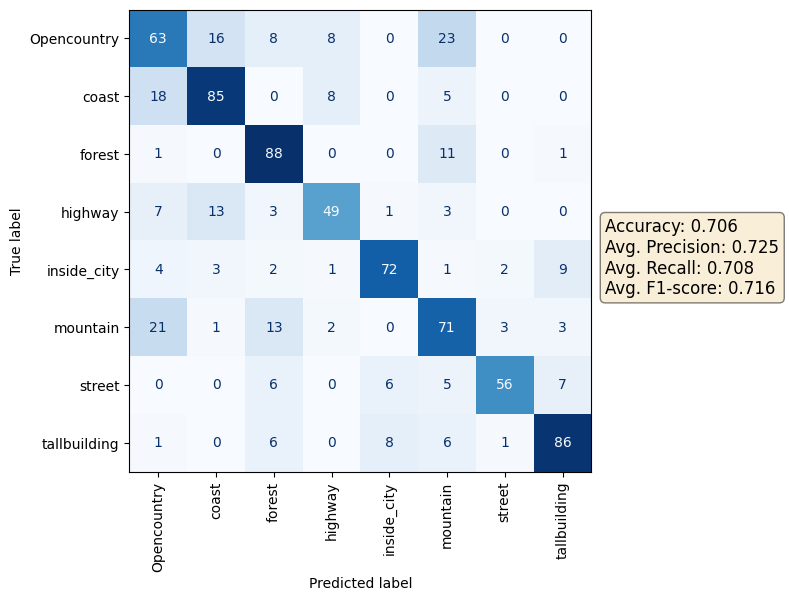

In [163]:
# plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(bovw.test_dataset['labels'], predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(bovw.test_dataset['labels']))
_, ax = plt.subplots(figsize=(6, 6))
disp.plot(ax=ax, cmap=plt.cm.Blues, xticks_rotation='vertical', colorbar=False)

# Adding text for metrics
textstr = '\n'.join((
    f'Accuracy: {accuracy(predictions, bovw.test_dataset["labels"]):.3f}',
    f'Avg. Precision: {average_precision(predictions, bovw.test_dataset["labels"]):.3f}',
    f'Avg. Recall: {average_recall(predictions, bovw.test_dataset["labels"]):.3f}',
    f'Avg. F1-score: {average_f1(predictions, bovw.test_dataset["labels"]):.3f}'))

# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

# Place a text box in upper left in axes coords
ax.text(1.03, 0.55, textstr, transform=ax.transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.show()

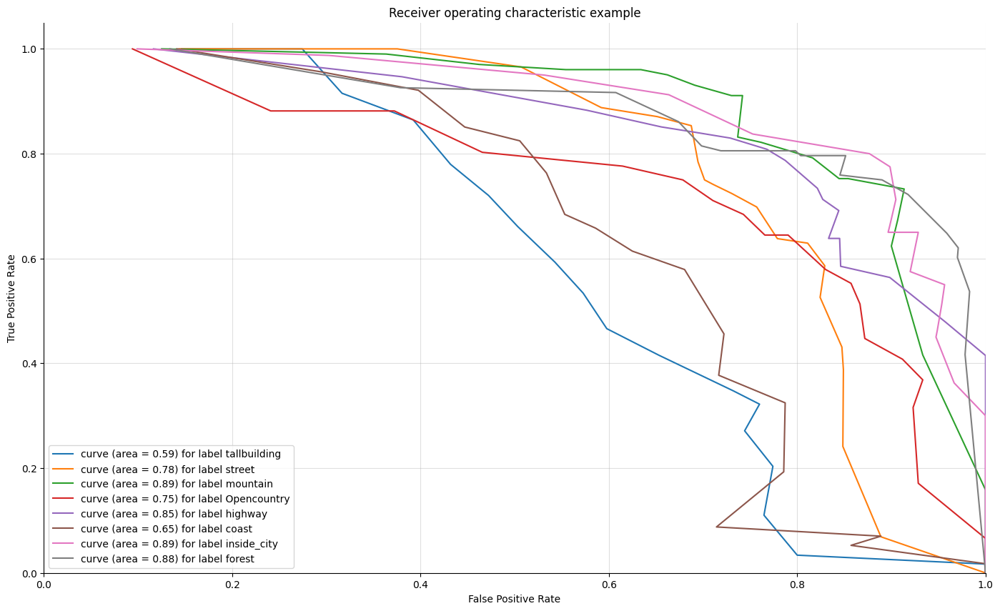

In [160]:
from sklearn.preprocessing import OneHotEncoder
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns


n_classes = set(bovw.test_dataset['labels'])
enc = OneHotEncoder(handle_unknown='ignore').fit_transform(np.array(bovw.test_dataset['labels']).reshape(-1, 1)).toarray()

def plot_multiclass_curve(y_test_onehot, y_score, n_classes, curve:str="pr", figsize=(17, 10)):

    # structures
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    # calculate dummies once
    y_test_dummies = y_test_onehot
    
    if curve == "roc":
        fcurve = roc_curve
        
    else:
        fcurve = precision_recall_curve
    for i, cl in enumerate(n_classes):
        fpr[i], tpr[i], _ = fcurve(y_test_dummies[:, i], y_score[:, i])
        
        if curve == "roc":
            roc_auc[i] = auc(fpr[i], tpr[i])
        else:
            roc_auc[i] = auc(tpr[i], fpr[i])

    # roc for each class
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic example')
    for i, cl in enumerate(n_classes):
        ax.plot(fpr[i], tpr[i], label='curve (area = %0.2f) for label %s' % (roc_auc[i], cl))
    ax.legend(loc="best")
    ax.grid(alpha=.4)
    sns.despine()
    plt.show()

plot_multiclass_curve(enc, y_score, n_classes=n_classes, curve="pr")


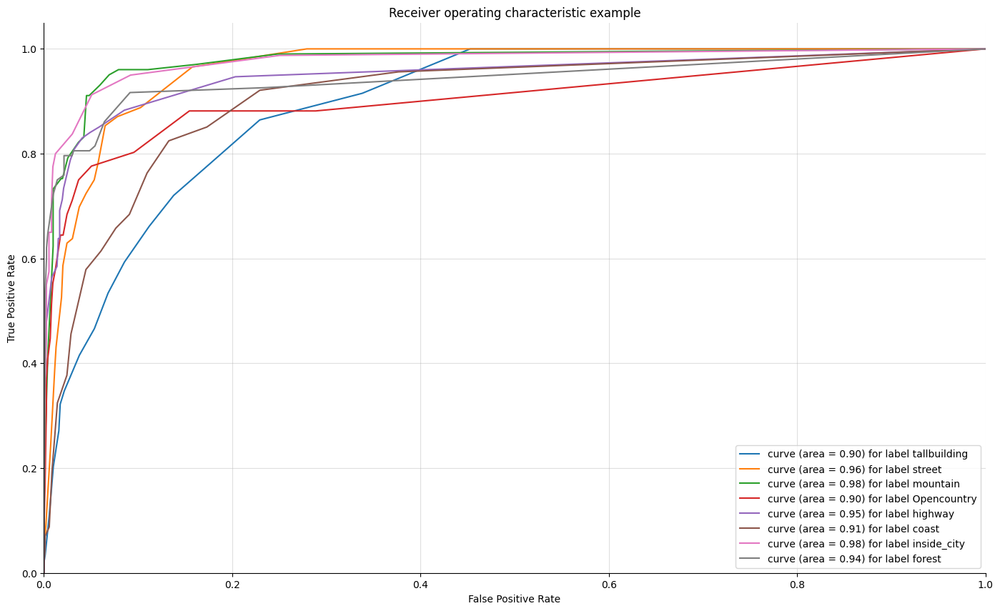

In [161]:
plot_multiclass_curve(enc, y_score, n_classes=n_classes, curve="roc")


Text(0.5, 1.0, 'Micro-averaged Precision-Recall curve')

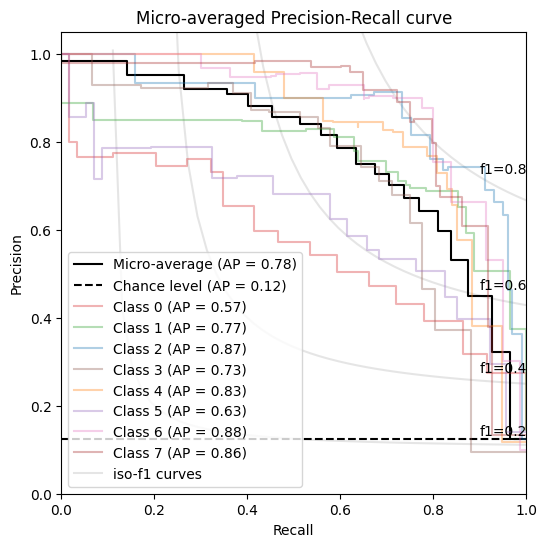

In [164]:
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html#sphx-glr-auto-examples-model-selection-plot-precision-recall-py
from sklearn.metrics import average_precision_score, precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
from itertools import cycle

colors = ["tab:red", "tab:green", "tab:blue", "tab:brown", "tab:orange", "tab:purple", "tab:pink", "brown"]

y_onehot_test = LabelBinarizer().fit_transform(bovw.test_dataset['labels'])
n_classes = y_onehot_test.shape[1]

# For each class
precision_dict  = dict()
recall_dict  = dict()
average_precision_dict = dict()
for i in range(n_classes):
    precision_dict[i], recall_dict[i], _ = precision_recall_curve(y_onehot_test[:, i], y_score[:, i])
    average_precision_dict[i] = average_precision_score(y_onehot_test[:, i], y_score[:, i])

# A "micro-average": quantifying score on all classes jointly
precision_dict["micro"], recall_dict["micro"], _ = precision_recall_curve(
    y_onehot_test.ravel(), y_score.ravel()
)
average_precision_dict["micro"] = average_precision_score(y_onehot_test, y_score, average="micro")

from collections import Counter

_, ax = plt.subplots(figsize=(6, 6))

f_scores = np.linspace(0.2, 0.8, num=4)
lines, labels = [], []
for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y = f_score * x / (2 * x - f_score)
    (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.2)
    plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))

display = PrecisionRecallDisplay(
    recall=recall_dict["micro"],
    precision=precision_dict["micro"],
    average_precision=average_precision_dict["micro"],
    prevalence_pos_label=Counter(y_onehot_test.ravel())[1] / y_onehot_test.size,
)
display.plot(ax=ax, name="Micro-average", plot_chance_level=True, color='black')

for i, color in zip(range(n_classes), colors):
    display = PrecisionRecallDisplay(
        recall=recall_dict[i],
        precision=precision_dict[i],
        average_precision=average_precision_dict[i],
    )
    display.plot(ax=ax, name=f"Class {i}", color=color, alpha=0.35)

# add the legend for the iso-f1 curves
handles, labels = display.ax_.get_legend_handles_labels()
handles.extend([l])
labels.extend(["iso-f1 curves"])
# set the legend and the axes
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.legend(handles=handles, labels=labels, loc="best")
ax.set_title("Micro-averaged Precision-Recall curve")

In [94]:
def visualize_correct_predictions(image_filenames, labels, predictions, samples_per_class=5):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of correctly classified samples: {sum(predictions==labels)}')
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    #set size for plot
    plt.figure(figsize=(24,16))
    
    def get_index_tp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] == labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_tp = get_index_tp(idxs_all)
        idxs = np.random.choice(idxs_tp, samples_per_class, replace=False)
        class_accuracy = 100*(len(idxs_tp)/len(idxs_all))
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')
            if i == 0:
                plt.title(f'ClassAccuracy: {class_accuracy:.2f}  \n GT: {labels[idx]},\n Pred: {predictions[idx]}')
            else:
                plt.title(f'GT: {labels[idx]},\n Pred: {predictions[idx]}')
    plt.show()
    
    
def visualize_wrong_predictions(image_filenames, labels, predictions, samples_per_class=5):
    print(f'Number of samples: {len(predictions)}')
    print(f'Number of wrongly classified samples: {sum(predictions!=labels)}')
    
    # get unique classses
    classes = np.unique(np.array(labels))
    num_classes = len(classes)
    #set size for plot
    plt.figure(figsize=(24,16))
    
    def get_index_fp(idxs):
        items = []
        for idx in idxs:
            if predictions[idx] != labels[idx]:
                items.append(idx)
        return items
    
    for y, cls in enumerate(classes):
        idxs_all = np.flatnonzero(np.array(labels) == cls)
        idxs_fp = get_index_fp(idxs_all)
        idxs = np.random.choice(idxs_fp, samples_per_class, replace=False)
        class_accuracy = 100*(1 - (len(idxs_fp)/len(idxs_all)))
        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + y + 1
            plt.subplot(samples_per_class, num_classes, plt_idx)
            plt.imshow(Image.open(image_filenames[idx]))
            plt.axis('off')

            if i == 0:
                plt.title(f'{cls} \n ClassAccuracy: {class_accuracy:.2f}  \n GT: {labels[idx]},\n Pred: {predictions[idx]}')
            else:
                plt.title(f'GT: {labels[idx]},\n Pred: {predictions[idx]}')
    plt.show()

Number of samples: 807
Number of correctly classified samples: 570


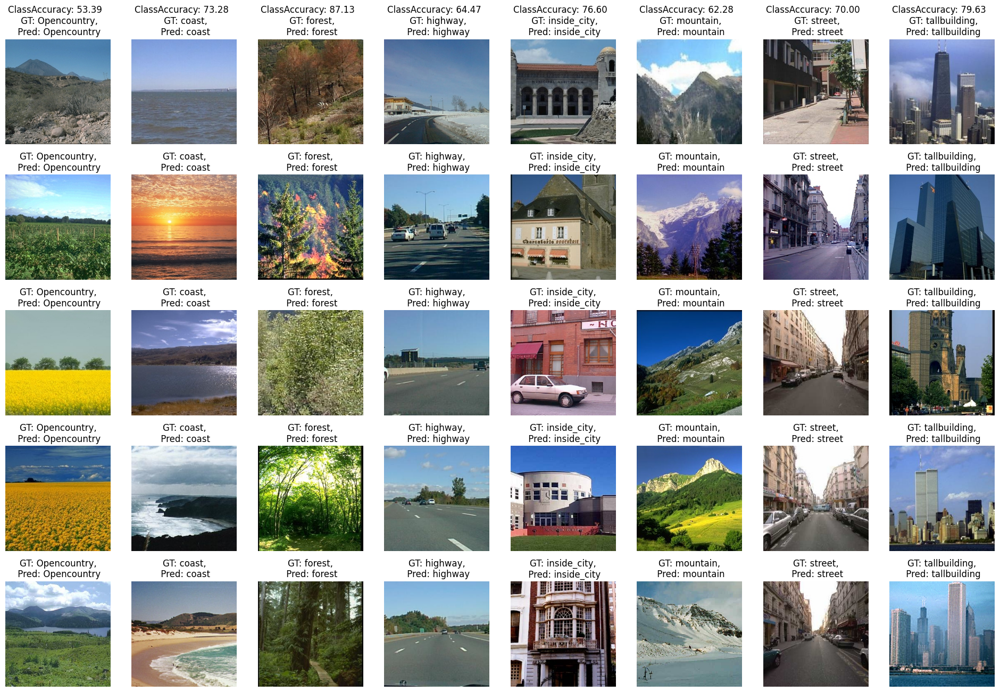

In [95]:
visualize_correct_predictions(bovw.test_dataset['image_paths'], bovw.test_dataset['labels'], predictions, samples_per_class=5)


Number of samples: 807
Number of wrongly classified samples: 237


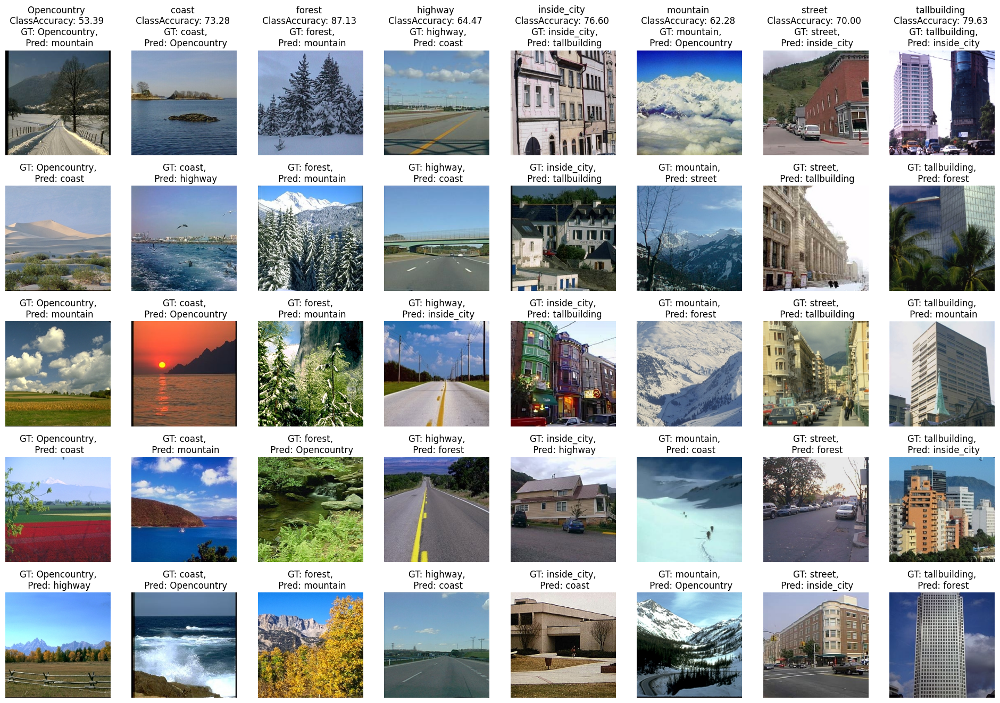

In [96]:
visualize_wrong_predictions(bovw.test_dataset['image_paths'], bovw.test_dataset['labels'], predictions, samples_per_class=5)